In [1]:
import tensorflow as tf
print("TF version:", tf.__version__)
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)
print("GPU", "available (YES!)"     if tf.config.list_physical_devices("GPU") else "not available:()")


TF version: 2.8.2
TF Hub version: 0.12.0
GPU not available:()


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

**Exploratory Data Analysis**

In [3]:
#checking data label
label = pd.read_csv("/content/drive/MyDrive/Colab files/labels.csv")

In [4]:
label.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [5]:
label.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [6]:
label['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

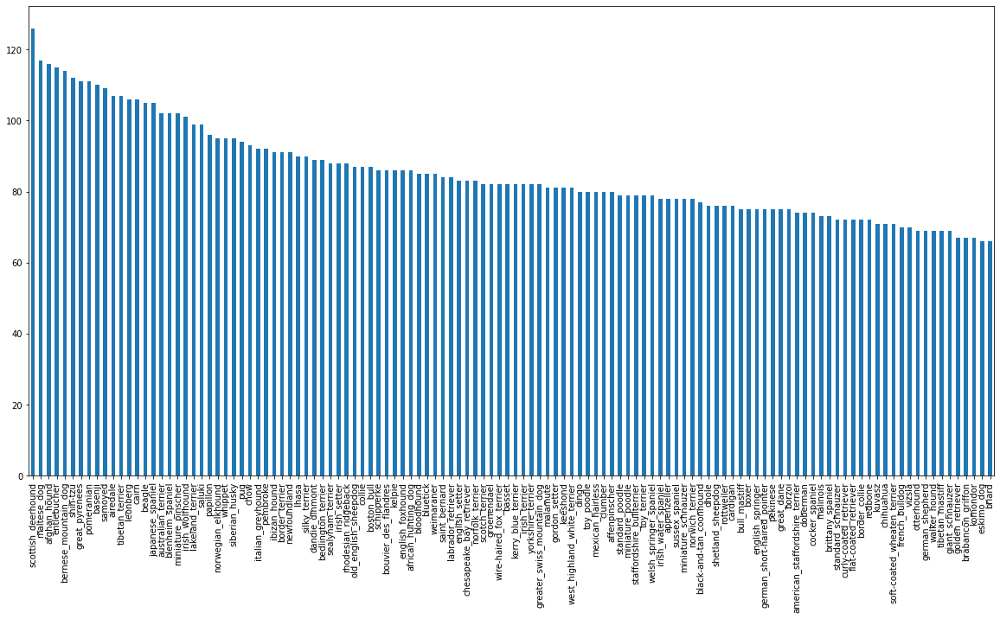

In [7]:
label["breed"].value_counts().plot.bar(figsize=(20, 10));

In [8]:
# Checking the median number of images per class
label["breed"].value_counts().median()

82.0

In [9]:
# Getting a list of images file pathnames

# Creating pathnames from images IDs
filenames = ["drive/My Drive/Colab files/train/" + fname + ".jpg" for fname in label["id"]]

In [10]:
filenames[:10]

['drive/My Drive/Colab files/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Colab files/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Colab files/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Colab files/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Colab files/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Colab files/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Colab files/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Colab files/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Colab files/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Colab files/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
len(filenames)

10222

In [12]:
# Checking if the number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Colab files/train/")) == len(filenames):
  print("Filenames match actual amount of files! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files! Proceed.


In [13]:
# Turning data label into numbers
labels = label["breed"].to_numpy() 
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# Checking if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [16]:
# Checking the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [17]:
len(unique_breeds)

120

In [18]:
# Converting labels into an array of booleans
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
len(boolean_labels)

10222

In [20]:
# Converting boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
print(labels[1])
print(boolean_labels[1].astype(int))

dingo
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


**Creating validation set**

In [22]:
# Set X & y variables
X = filenames
y = boolean_labels

In [23]:
# Due to processing time, starting experiment with 1000 images and will increase as needed.
NUM_IMAGES = 1000 #@param{type:"slider", min:1000, max:10000, step:1000}

In [24]:
# Split data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

**Converting images into Tensors**

In [25]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [26]:
#checking max and min pixel
image.max(), image.min()

(255, 0)

In [27]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [28]:
# Define image size
IMG_SIZE = 224

# Creating a function to preprocess images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

**Batch Processing(Converting data into batches)**

In [29]:
# Converting data in the form of Tensor tuples (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [30]:
# using batch size of 32 
BATCH_SIZE = 32

# Function that turns data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, no labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, no shuffling data
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [31]:
# Create train and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [32]:
# Checking attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [33]:
# Visualizing Data Batches

# Function to view images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [34]:
#Unbatch before visualizing train set
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.909804  , 0.6627451 , 0.40000004],
          [0.91372555, 0.6666667 , 0.4039216 ],
          [0.91775966, 0.6707008 , 0.4079557 ],
          ...,
          [0.46042684, 0.24960743, 0.14733152],
          [0.45073768, 0.25644505, 0.15781054],
          [0.41804457, 0.23373082, 0.13177003]],
 
         [[0.91372555, 0.6666667 , 0.4039216 ],
          [0.9170944 , 0.67003554, 0.40729046],
          [0.9215687 , 0.6745098 , 0.41176474],
          ...,
          [0.4566178 , 0.24579841, 0.1435225 ],
          [0.45062274, 0.25406912, 0.15626748],
          [0.4330156 , 0.23659205, 0.1387254 ]],
 
         [[0.9168068 , 0.66974795, 0.40700284],
          [0.92026067, 0.6732018 , 0.41045672],
          [0.9218163 , 0.6747574 , 0.41201234],
          ...,
          [0.4599466 , 0.24912722, 0.14685133],
          [0.4598739 , 0.25144812, 0.15057273],
          [0.4529686 , 0.24707888, 0.1452931 ]],
 
         ...,
 
         [[0.99691886, 0.8313726 , 0.5316526 ],
          [0.99869

In [35]:
len(train_images), len(train_labels)

(32, 32)

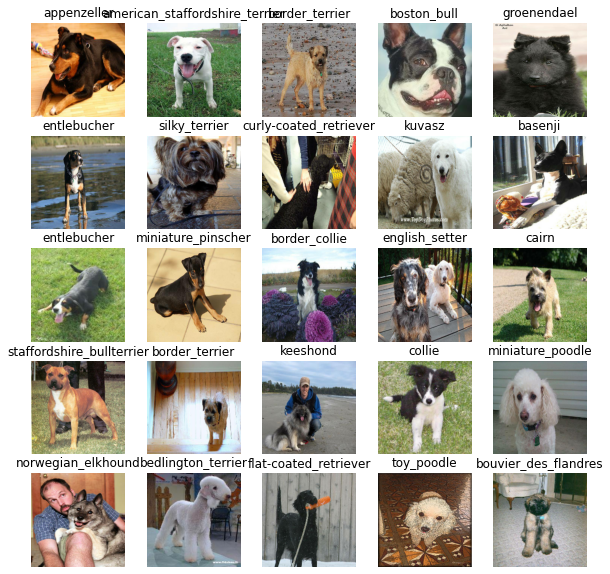

In [36]:
# Visualizing training data
show_25_images(train_images, train_labels)

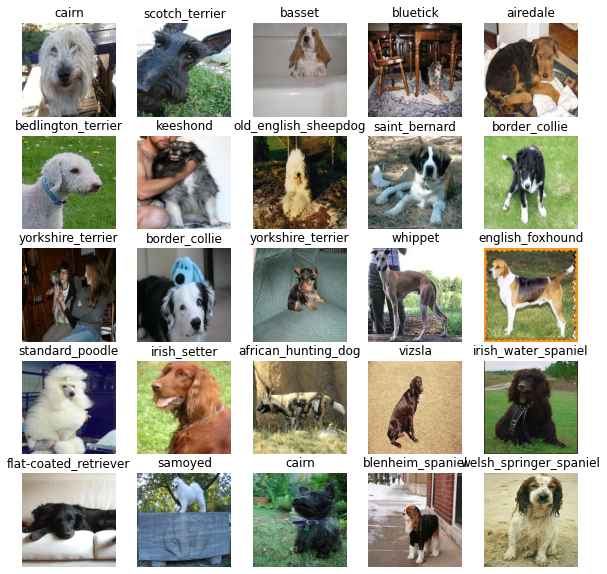

In [37]:
 # Visualizing validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

**Building and Training model**

In [38]:
#Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Using MobileNet V2 model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [39]:
# Keras model Function
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [40]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [41]:
# Creating TensorBoard Callback to monitor model's performance
%load_ext tensorboard

import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Colab files/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [42]:
# Create early stopping callback to stop model from overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [43]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [44]:
# Train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime model trains
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [45]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 218s 9s/step - loss: 4.6567 - accuracy: 0.0875 - val_loss: 3.4510 - val_accuracy: 0.3100
Epoch 2/100
25/25 [==============================] - 41s 2s/step - loss: 1.6805 - accuracy: 0.6725 - val_loss: 2.2125 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 39s 2s/step - loss: 0.5961 - accuracy: 0.9400 - val_loss: 1.7128 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 37s 1s/step - loss: 0.2594 - accuracy: 0.9825 - val_loss: 1.5221 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 40s 2s/step - loss: 0.1506 - accuracy: 0.9962 - val_loss: 1.4566 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 44s 2s/step - loss: 0.1049 - accuracy: 0.9987 - val_loss: 1.4096 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================] - 36s 1s/

**Evaluating Model's Performance with TensorBoard**

In [46]:
%tensorboard --logdir drive/My\ Drive/Colab\ files/logs

<IPython.core.display.Javascript object>

**Making predictions with trained model**

In [47]:
# Make predictions on the validation data (not used in training)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 8s 948ms/step


array([[6.3702336e-04, 5.8427562e-05, 1.5899529e-03, ..., 1.9581043e-04,
        3.0097281e-05, 5.7903951e-04],
       [7.3209126e-04, 1.8542448e-04, 1.7155193e-02, ..., 2.1169374e-04,
        3.5890733e-04, 2.0858990e-04],
       [7.4217911e-05, 9.6186457e-05, 1.7724355e-05, ..., 1.5540652e-05,
        1.9899471e-06, 5.4996973e-04],
       ...,
       [5.9580693e-06, 6.1767540e-05, 1.7294275e-05, ..., 4.1969415e-06,
        2.8955665e-05, 4.7240366e-05],
       [1.8495170e-03, 7.0810915e-05, 6.1403123e-05, ..., 6.6564171e-05,
        9.8191849e-05, 3.4014713e-03],
       [1.0830732e-03, 3.0509348e-06, 3.0494353e-03, ..., 7.2196894e-03,
        1.0792782e-03, 1.9819876e-04]], dtype=float32)

In [ ]:
predictions.shape

In [49]:
# Make predictions on the test data
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [50]:
pred_label = get_pred_label(predictions[81])
pred_label

'basenji'

In [51]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [52]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

**Visualizing Model's Predictions**

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

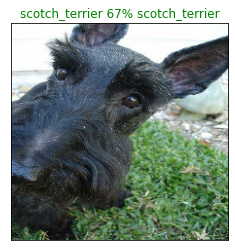

In [54]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=1)

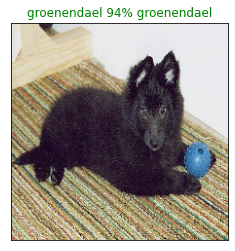

In [55]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

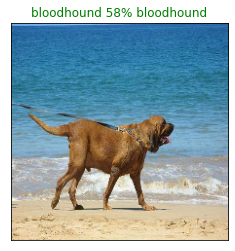

In [56]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=100)

In [57]:
# Visualizing top 10 predictions
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

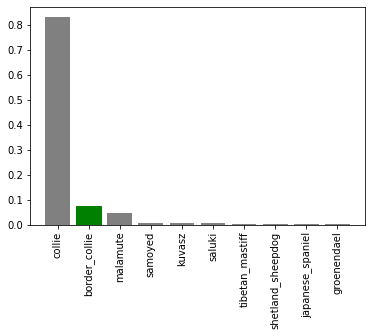

In [58]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

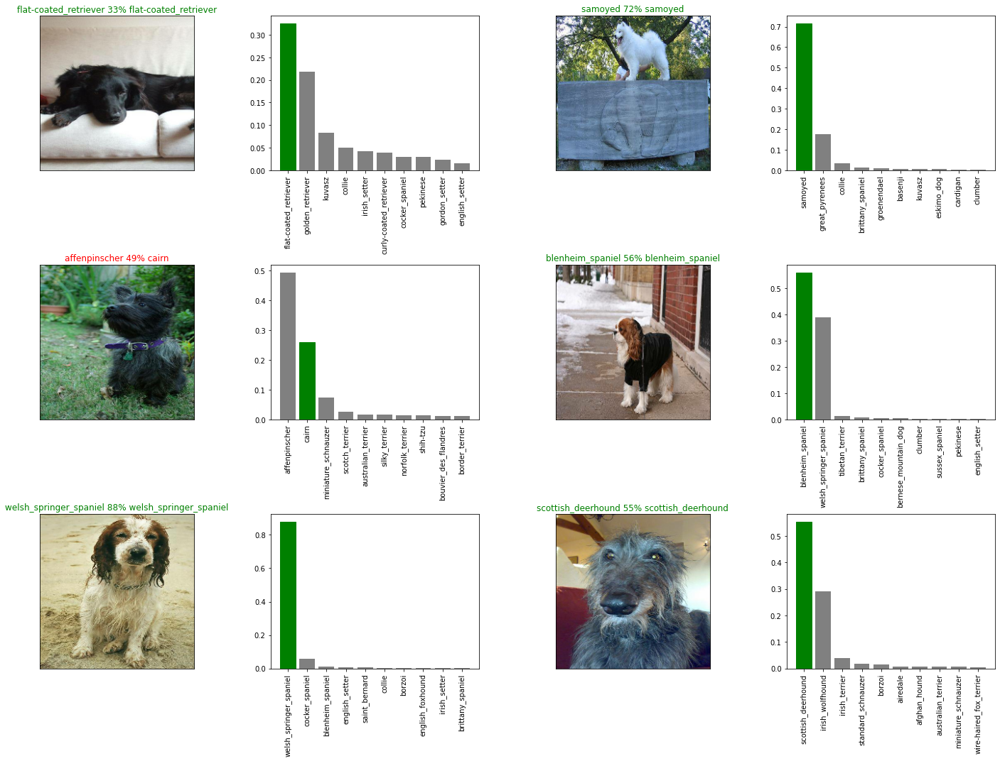

In [59]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Training model on the full data**

In [60]:
len(X), len(y)

(10222, 10222)

In [61]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [62]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [63]:
full_model = create_model()
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [64]:
%tensorboard --logdir drive/My\ Drive/Colab files/logs

ERROR: Failed to launch TensorBoard (exited with 2).
Contents of stderr:
usage: tensorboard [-h] [--helpfull] [--logdir PATH] [--logdir_spec PATH_SPEC]
                   [--host ADDR] [--bind_all] [--port PORT]
                   [--reuse_port BOOL] [--load_fast {false,auto,true}]
                   [--extra_data_server_flags EXTRA_DATA_SERVER_FLAGS]
                   [--grpc_creds_type {local,ssl,ssl_dev}]
                   [--grpc_data_provider PORT] [--purge_orphaned_data BOOL]
                   [--db URI] [--db_import] [--inspect] [--version_tb]
                   [--tag TAG] [--event_file PATH] [--path_prefix PATH]
                   [--window_title TEXT] [--max_reload_threads COUNT]
                   [--reload_interval SECONDS] [--reload_task TYPE]
                   [--reload_multifile BOOL]
                   [--reload_multifile_inactive_secs SECONDS]
                   [--generic_data TYPE]
                   [--samples_per_plugin SAMPLES_PER_PLUGIN]
                   [-

In [65]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, 
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 391s 1s/step - loss: 1.3207 - accuracy: 0.6723
Epoch 2/100
320/320 [==============================] - 391s 1s/step - loss: 0.4049 - accuracy: 0.8799
Epoch 3/100
320/320 [==============================] - 398s 1s/step - loss: 0.2404 - accuracy: 0.9325
Epoch 4/100
320/320 [==============================] - 379s 1s/step - loss: 0.1534 - accuracy: 0.9634
Epoch 5/100
320/320 [==============================] - 383s 1s/step - loss: 0.1054 - accuracy: 0.9798
Epoch 6/100
320/320 [==============================] - 382s 1s/step - loss: 0.0771 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 387s 1s/step - loss: 0.0599 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 383s 1s/step - loss: 0.0468 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 387s 1s/step - loss: 0.0374 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 387s 1s/step - loss: 0.030

**Making predictions on Test Data**

In [ ]:
# Loading test image filenames
test_path = "drive/My Drive/Colab files/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/My Drive/Colab files/test/de6cc38e54a460dd34c53b74f022a8da.jpg',
 'drive/My Drive/Colab files/test/dcae38083c0e6a8afe15b6f0703bdefa.jpg',
 'drive/My Drive/Colab files/test/e2b24cea9d0796ffad73cb24eab1a3f6.jpg',
 'drive/My Drive/Colab files/test/e5657f523cf994628f63b673c88e9112.jpg',
 'drive/My Drive/Colab files/test/e51de127ddf2c492372a63f0644b1a58.jpg',
 'drive/My Drive/Colab files/test/e1dd78810048dc387573f2ec50e4bb16.jpg',
 'drive/My Drive/Colab files/test/dcb9aeaf9f1a5c11e95509376d8788ca.jpg',
 'drive/My Drive/Colab files/test/e26d745f820e6b14cae26bb5def0648f.jpg',
 'drive/My Drive/Colab files/test/df92d68c07ec91b2f67cec77980e00cf.jpg',
 'drive/My Drive/Colab files/test/e008da6b957c62e7bcf6eb2ba4c2abd9.jpg']

In [68]:
len(test_filenames)

10357

In [69]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [71]:
test_predictions = full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1758s 5s/step


In [72]:
test_predictions[:10]

array([[2.2203194e-12, 6.4473169e-09, 3.4768590e-09, ..., 2.3053348e-08,
        8.6352658e-09, 9.8670981e-11],
       [6.1060380e-12, 2.1470129e-03, 1.4589141e-09, ..., 4.9004248e-06,
        6.1300831e-10, 1.2015096e-07],
       [9.9951997e-15, 1.2808946e-11, 6.1725218e-13, ..., 9.9999237e-01,
        6.0759113e-09, 3.3875461e-12],
       ...,
       [5.9643554e-07, 3.6905786e-07, 1.8516708e-06, ..., 4.5606001e-05,
        8.8735338e-05, 8.9727344e-08],
       [1.3008539e-11, 2.0413792e-12, 1.2755347e-15, ..., 1.5019442e-15,
        7.8164555e-16, 2.6064545e-13],
       [2.6547246e-08, 8.6778709e-11, 6.1205441e-08, ..., 9.6642935e-08,
        1.9070749e-04, 7.8064397e-07]], dtype=float32)

In [73]:
# Save predictions (Numpy array) to csv file(for access later)
np.savetxt("drive/My Drive/Colab files/preds_array.csv", test_predictions, delimiter=",")

In [74]:
#load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Colab files/preds_array.csv", delimiter=",")

**Saving and reloading trained model**

In [75]:
def save_model(model, suffix=None):
  modeldir = os.path.join("drive/My Drive/Colab files/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [76]:
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [77]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Colab files/models/20221003-20291664828977-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Colab files/models/20221003-20291664828977-full-image-set-mobilenetv2-Adam.h5'

In [78]:
loaded_full_model = load_model("drive/My Drive/Colab files/models/20220926-17141664212464-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Colab files/models/20220926-17141664212464-full-image-set-mobilenetv2-Adam.h5


**Preparing test dataset predictions for Kaggle Submission**

In [79]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [81]:
# Append test image ID's to predictions DataFrame
test_path = "drive/My Drive/Colab files/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de6cc38e54a460dd34c53b74f022a8da,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dcae38083c0e6a8afe15b6f0703bdefa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e2b24cea9d0796ffad73cb24eab1a3f6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e5657f523cf994628f63b673c88e9112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e51de127ddf2c492372a63f0644b1a58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [82]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de6cc38e54a460dd34c53b74f022a8da,2.220319e-12,6.447317e-09,3.476859e-09,9.191015e-06,5.503717e-11,1.023046e-07,8.404092e-09,2.735574e-09,4.283568e-04,...,2.355174e-12,5.156478e-10,1.743468e-05,2.119132e-05,1.326724e-07,1.106885e-04,1.201282e-09,2.305335e-08,8.635266e-09,9.867098e-11
1,dcae38083c0e6a8afe15b6f0703bdefa,6.106038e-12,2.147013e-03,1.458914e-09,1.336559e-11,5.928431e-09,6.887214e-11,5.440532e-10,3.152539e-12,2.763978e-10,...,4.446879e-08,8.310129e-12,1.971211e-07,1.933492e-07,3.948944e-06,2.799638e-10,3.174602e-14,4.900425e-06,6.130083e-10,1.201510e-07
2,e2b24cea9d0796ffad73cb24eab1a3f6,9.995200e-15,1.280895e-11,6.172522e-13,4.088526e-14,2.610743e-07,1.651339e-12,5.014551e-13,5.619958e-11,2.811310e-13,...,5.297364e-12,1.740261e-11,7.786527e-15,2.018664e-09,1.066757e-10,7.391501e-17,1.877397e-12,9.999924e-01,6.075911e-09,3.387546e-12
3,e5657f523cf994628f63b673c88e9112,6.061642e-08,1.005616e-07,8.013766e-09,1.771483e-08,3.408810e-09,2.001559e-07,1.918401e-10,2.749256e-10,5.202666e-09,...,6.270238e-10,7.535379e-12,1.235367e-09,5.262906e-10,1.112970e-09,4.058999e-11,2.921147e-10,1.185083e-08,3.887906e-10,9.966185e-12
4,e51de127ddf2c492372a63f0644b1a58,1.710379e-11,5.200225e-10,1.525684e-10,1.374416e-09,1.244890e-06,8.401896e-08,4.378285e-10,7.129361e-13,1.089792e-12,...,3.023261e-10,9.294761e-11,2.454172e-08,2.036585e-10,3.606865e-01,8.297660e-14,7.019370e-12,2.599823e-05,6.644777e-09,3.639927e-12


In [83]:
preds_df.to_csv("drive/My Drive/Colab files/full_submission_1_mobilienetV2_adam.csv",
                 index=False)